In [8]:
# %matplotlib notebook

In [1]:
%load_ext autoreload
%autoreload 2

from importlib import reload
import datetime 

import numpy as np
import statsmodels.api as sm
import statsmodels.tsa.api as tsa
import quantstats as qs

import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sb

plt.rcParams['figure.figsize'] = [6, 3]

In [2]:
import funcs
import datatools
import strategy
import features

from funcs import *
from datatools import *
from strategy import *
from features import dfx, dfy, dfref

# Load Data

In [3]:
#%% load data
results = pd.read_parquet("data/results/results.pq")
# dftr = pd.read_parquet("data/workspace/dftotrtn.pq").reset_index()
# dfref = pd.read_csv("data/processed/etfref.csv")

# dftr['index'] = dftr['index'].apply(lambda x: pd.to_datetime(x).date())
# dftr.set_index('index', inplace=True)
# tickers = results['ticker'].unique()

results['ticker'] = results['ticker'].apply(lambda x: x.upper())

etfs2keep = ['AGG','VCIT','SPIB','BSV','JNK','TBT','TMV','VCLT','LQD','TMF','SPY','SPYG','SPLG','KBE','XRT','DBC',
             'GSG','UNG','XOP', '6040', 'NAIVEVOL']
results['keep'] = results['ticker'].apply(lambda x: x.upper() in etfs2keep)
results = results[results['keep'] == True]
results.drop('keep', axis=1, inplace=True)

results.to_clipboard()

In [15]:
head(results[results['ticker'] == 'AGG'])

,y_up,y_up_hat,longonly,longshort,ticker,y_rtn,strat_lo_rtn,strat_ls_rtn,base_totrtn,strat_lo_tr,strat_ls_tr,base_vol,strat_lo_vol,strat_ls_vol,correct,is_up_month
refmonthyear,,,,,,,,,,,,,,,,
JAN.2016,False,False,0,-1,AGG,0.012782,0.000000,-0.012782,101.278186,100.000000,98.721814,NaN,NaN,NaN,1,True
FEB.2016,True,False,0,-1,AGG,0.010093,0.000000,-0.010093,102.300378,100.000000,97.725424,NaN,NaN,NaN,0,True
MAR.2016,True,False,0,-1,AGG,0.011777,0.000000,-0.011777,103.505155,100.000000,96.574525,NaN,NaN,NaN,0,True
APR.2016,True,True,1,1,AGG,0.003439,0.003439,0.003439,103.861059,100.343852,96.906599,NaN,NaN,NaN,1,True
MAY.2016,True,True,1,1,AGG,0.000814,0.000814,0.000814,103.945588,100.425518,96.985467,NaN,NaN,NaN,1,True


In [19]:
results.pivot(columns='ticker', values='strat_ls_tr').to_clipboard()

BND
-------
AGG
-------
TLT
-------
VCIT
-------
VCSH
-------
BIL
-------
BSV
-------
LQD
-------
IEF
-------
SHY
-------
VGSH
-------
VGIT
-------
IGSB
-------
HYG
-------
SHV
-------
TIP
-------
BIV
-------
PFF
-------
IEI
-------
IGIB
-------
SCHO
-------


C:\Users\lcota\AppData\Local\Temp\ipykernel_21508\960258483.py:15: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(figsize=(14, 8))


SCHP
-------
VGLT
-------
SPTL
-------
JNK
-------
SCHR
-------
TLH
-------
SPAB
-------
SCHZ
-------
FLOT
-------
SPIB
-------
SPSB
-------
VCLT
-------
SPTS
-------
TMF
-------
SPTI
-------
PGX
-------
IGLB
-------
TBT
-------
TMV
-------
SPY
-------
DIA
-------
SPLG
-------
SPYG
-------
SPYV
-------
XBI
-------
KRE
-------
XOP
-------
XME
-------
KBE
-------
XHB
-------
KIE
-------
XRT
-------
GLD
-------
IAU
-------
SLV
-------
SGOL
-------
DBC
-------
USO
-------
GSG
-------
UNG
-------
BOIL
-------
AGQ
-------
DBO
-------
NAIVEVOL
-------
6040
-------


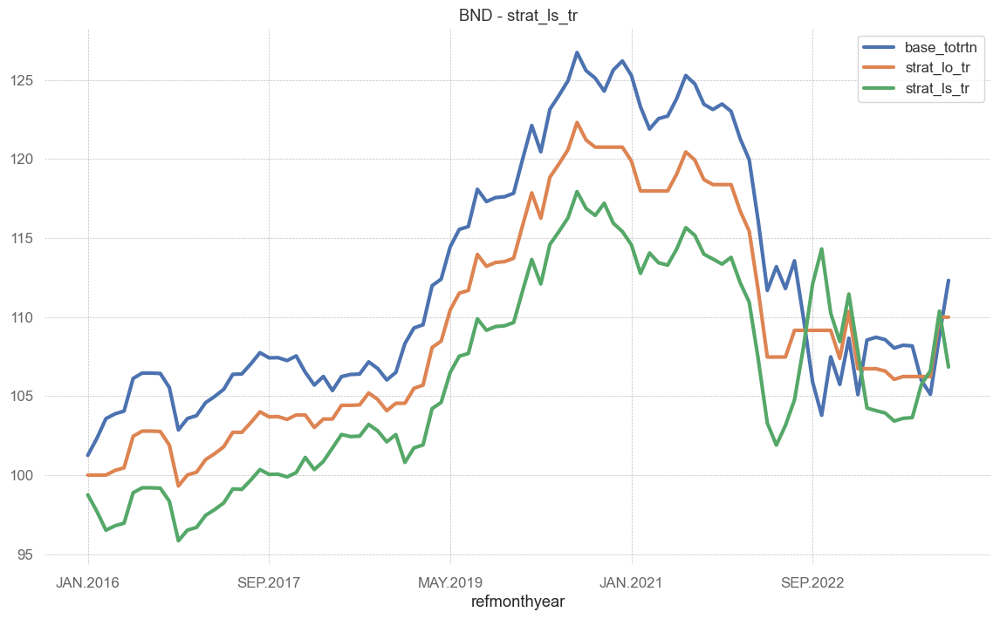

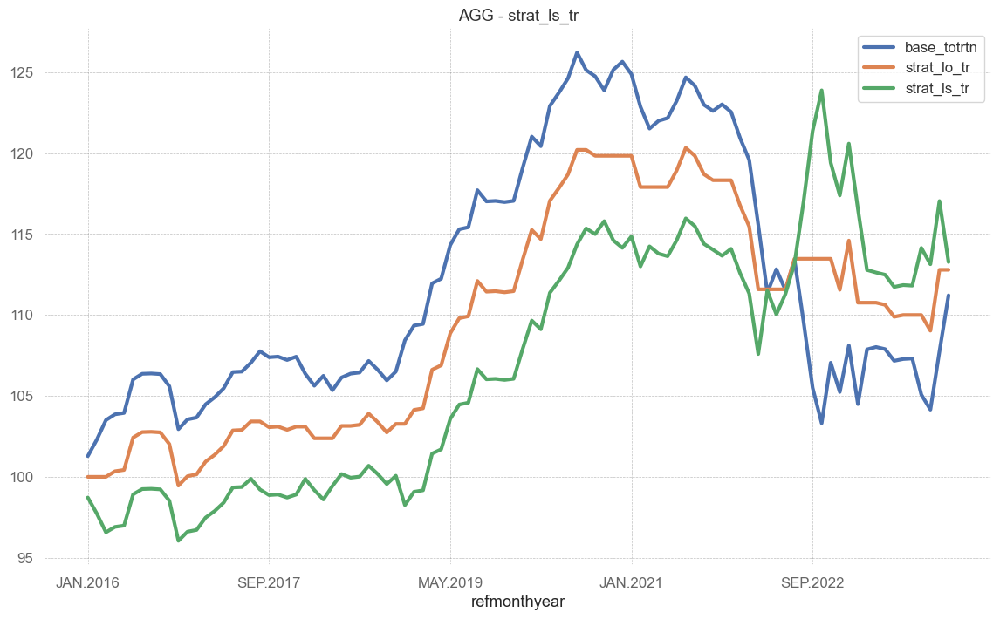

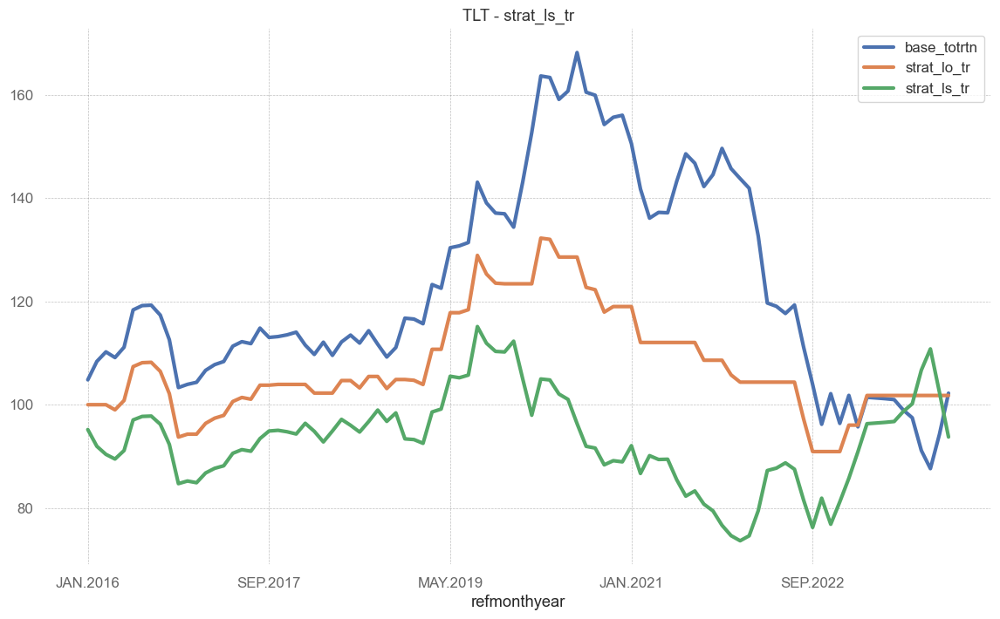

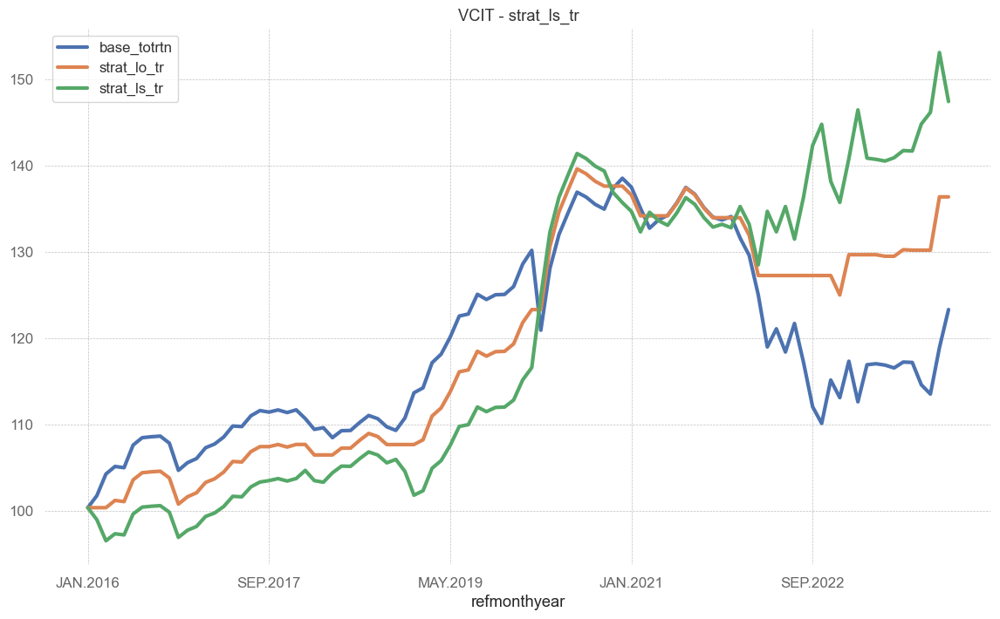

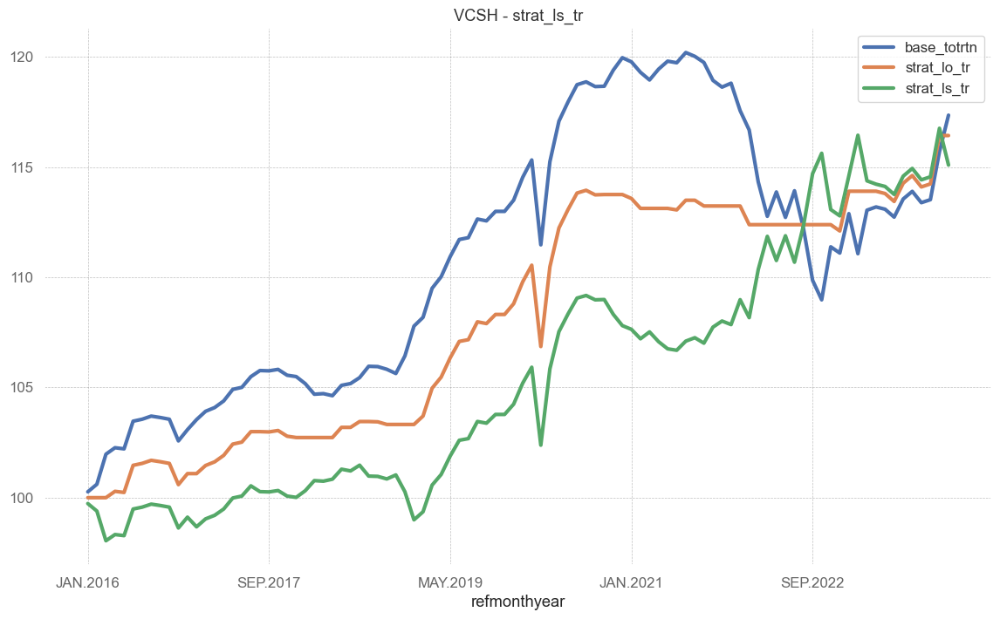

...

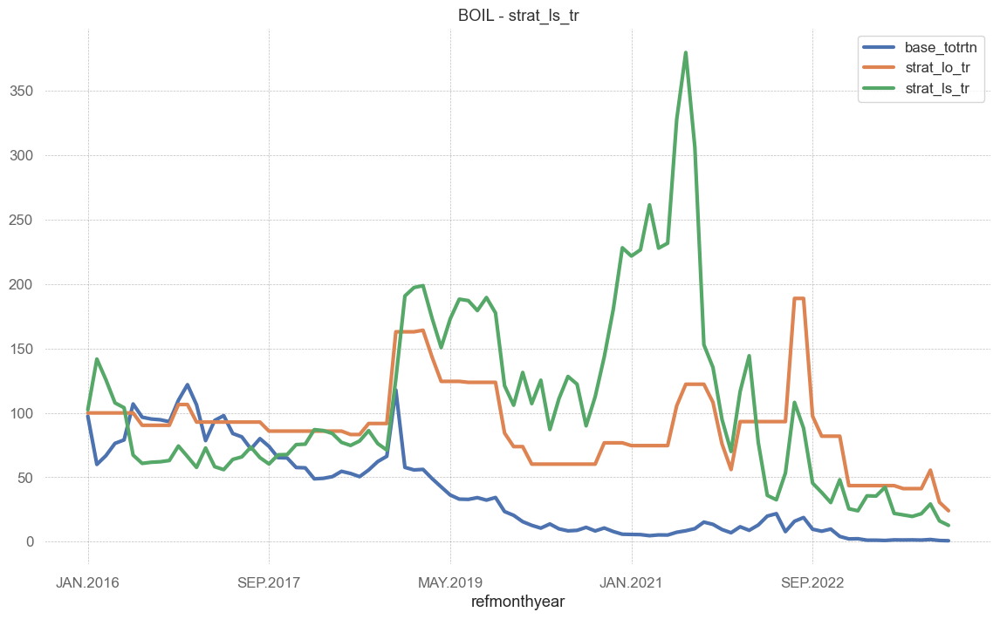

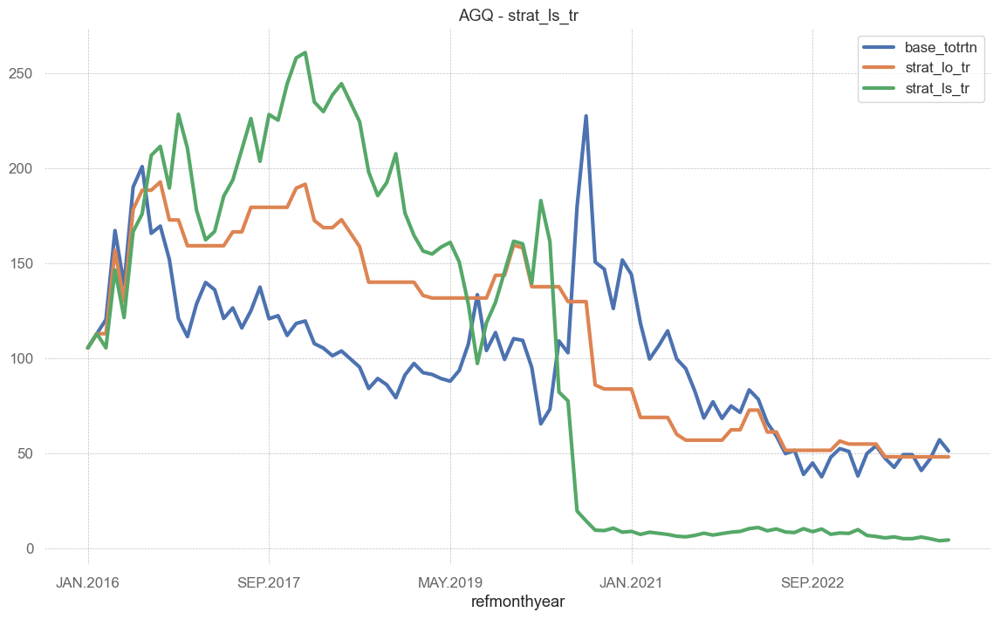

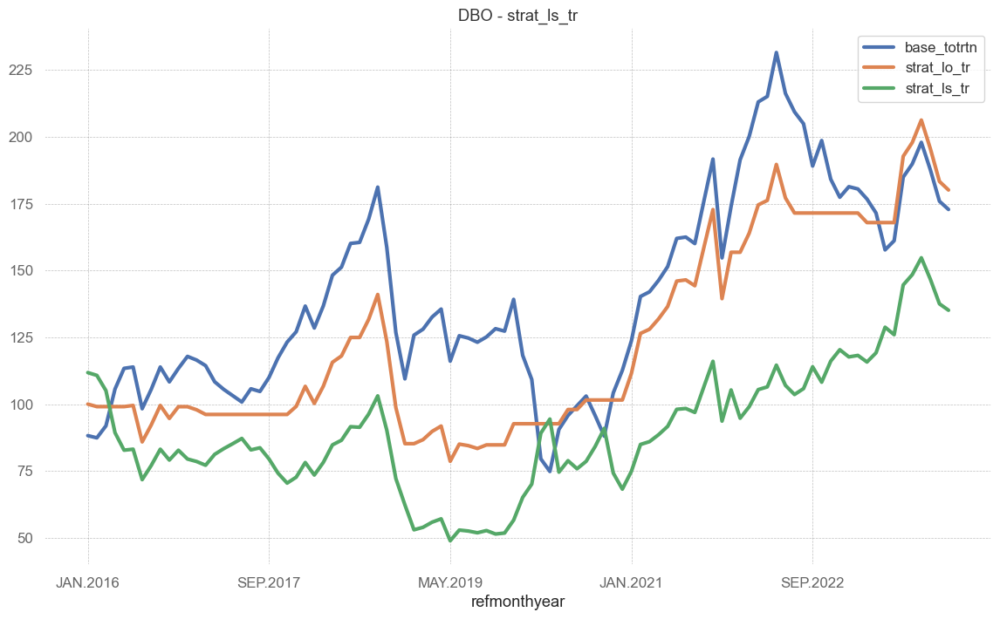

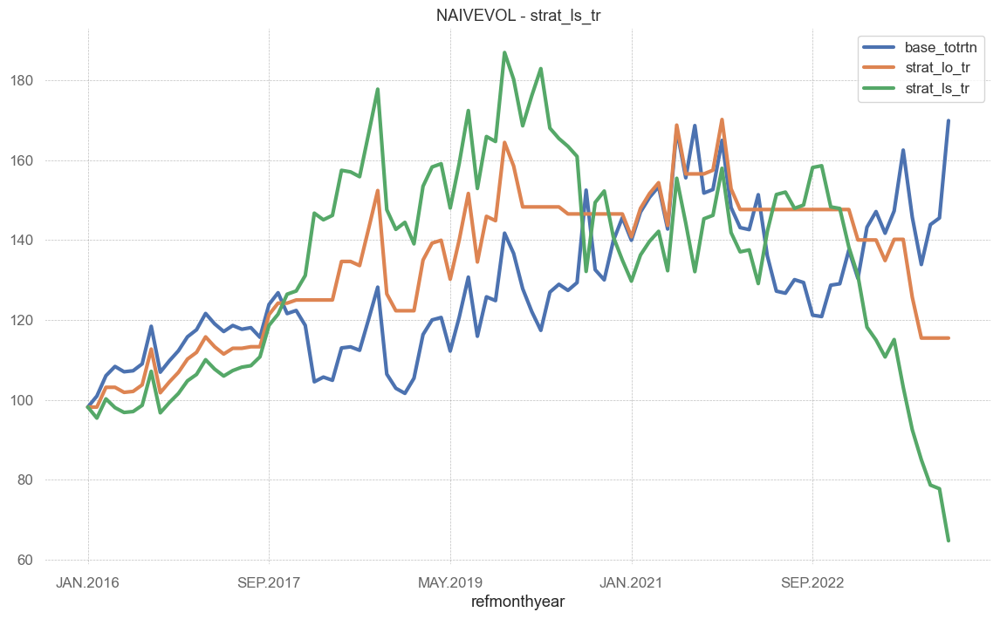

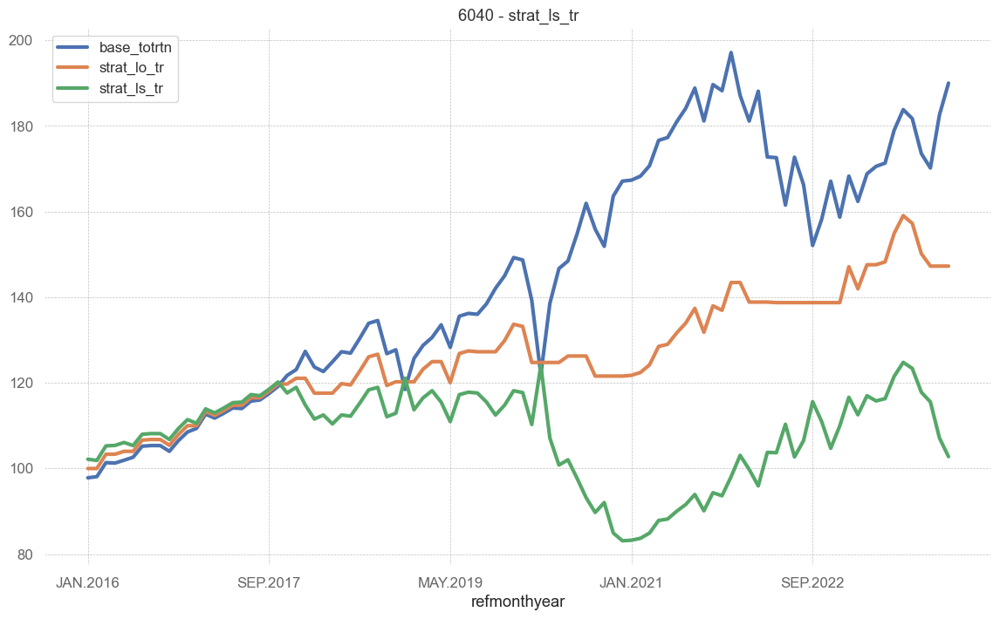

In [11]:
ticker = 'spy'
lag = "na"
prefix = "trailing_thresh"
shorts = "noshort"
strats = []

strategies = ['base_totrtn', 'strat_lo_tr',	'strat_ls_tr']

for ticker in results.ticker.unique():
    returns = results[results['ticker'] == ticker]
    print("===================================")
    print(ticker)
    print("-------")
    # for signame in signames[1:2]:
    fig, ax = plt.subplots(figsize=(14, 8))
    for strategy in strategies:
        figtitle = f"{ticker} - {strategy}"
        dfrtn = returns[strategy]
                
        # dfstrat[dfstrat.columns[-4:]].plot(title=f"{figtitle}", ax=ax)
        returns[strategy].plot(title=figtitle, ax=ax, lw=3)
    plt.grid(ls='--', color='grey', alpha=.5)
    plt.legend()
    figname = f"plots/tr/{ticker}.png"
    plt.savefig(figname, dpi=200)


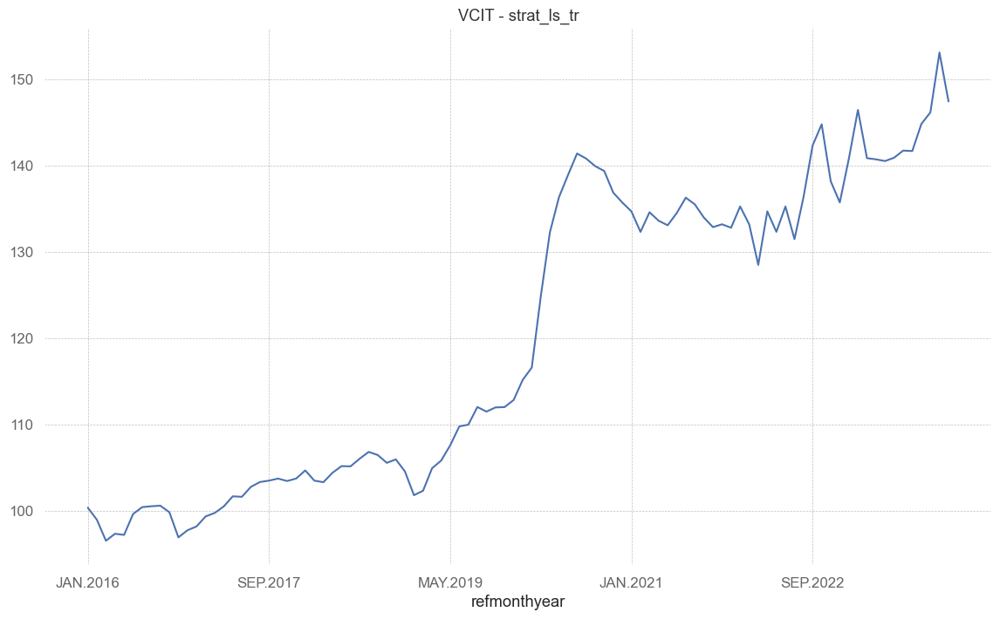

In [4]:
vcit = results[results['ticker'] == 'VCIT']['strat_ls_tr']


In [20]:
results

,y_up,y_up_hat,longonly,longshort,ticker,y_rtn,strat_lo_rtn,strat_ls_rtn,base_totrtn,strat_lo_tr,strat_ls_tr,base_vol,strat_lo_vol,strat_ls_vol,correct,is_up_month
refmonthyear,,,,,,,,,,,,,,,,
JAN.2016,False,False,0,-1,AGG,0.012782,0.000000,-0.012782,101.278186,100.000000,98.721814,NaN,NaN,NaN,1,True
FEB.2016,True,False,0,-1,AGG,0.010093,0.000000,-0.010093,102.300378,100.000000,97.725424,NaN,NaN,NaN,0,True
MAR.2016,True,False,0,-1,AGG,0.011777,0.000000,-0.011777,103.505155,100.000000,96.574525,NaN,NaN,NaN,0,True
APR.2016,True,True,1,1,AGG,0.003439,0.003439,0.003439,103.861059,100.343852,96.906599,NaN,NaN,NaN,1,True
MAY.2016,True,True,1,1,AGG,0.000814,0.000814,0.000814,103.945588,100.425518,96.985467,NaN,NaN,NaN,1,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
AUG.2023,False,True,1,1,UNG,0.027457,0.027457,0.027457,42.757435,58.601764,27.201962,NaN,NaN,NaN,0,True
SEP.2023,True,True,1,1,UNG,-0.031206,-0.031206,-0.031206,41.423159,56.773054,26.353105,NaN,NaN,NaN,1,False
OCT.2023,False,True,1,1,UNG,0.131222,0.131222,0.131222,46.858776,64.222911,29.811205,NaN,NaN,NaN,0,True


In [14]:
len(results[results.keep]a['ticker'].unique())

0

In [36]:
#%% Quadrant Plots


dfytrans = dfy.copy() # transpose of returns matrix, dfy
dfytrans.columns = [c.upper() for c in dfytrans.columns]
dfytrans = dfytrans[etfs2keep]
dfytrans = dfytrans.T.reset_index()

dfytrans['index'] = dfytrans['index'].apply(lambda x: x.upper())
dfytrans['ticker'] = dfytrans['index'].copy()
dfytrans.drop('index', axis=1, inplace=True)

dfytrans['keep'] = dfytrans.ticker.apply(lambda x: x in etfs2keep)
dfytrans = dfytrans[dfytrans.keep == True].copy()
dfytrans.drop('keep', axis=1, inplace=True)

In [37]:
dfytrans = pd.merge(dfytrans, 
                    dfref.reset_index()[['ticker', 'group', 'subgroup', 'name']], 
                    left_on='ticker', 
                    right_on='ticker', 
                    suffixes=('', ''))

In [38]:
head(dfytrans.set_index(['group', 'ticker']))

JAN.2012  FEB.2012  MAR.2012  APR.2012  MAY.2012  JUN.2012  \
group     ticker                                                               
Debt Fund AGG     0.009270  0.001628 -0.003718  0.008940  0.011149 -0.002687   
          VCIT    0.026270  0.007706 -0.007574  0.015767  0.003570  0.005203   
          SPIB    0.020206  0.005015 -0.002648  0.005021 -0.000881  0.007081   
          BSV     0.005690 -0.000862 -0.001727  0.003710  0.001604  0.000124   
          JNK     0.020952  0.017513 -0.012788  0.013004 -0.038112  0.049746   

                  JUL.2012  AUG.2012  SEP.2012  OCT.2012  ...  MAY.2023  \
group     ticker                                          ...             
Debt Fund AGG     0.011681  0.001159  0.002853 -0.000089  ... -0.001216   
          VCIT    0.018278  0.007235  0.009620  0.010699  ... -0.001386   
          SPIB    0.011414  0.006089  0.009259  0.003730  ... -0.001858   
          BSV     0.005184  0.003324  0.002092 -0.000122  ... -0.001836   
          JNK     0.014758  0.009049  0.008781  0.009004  ... -0.008189   

                  JUN.2023  JUL.2023  AUG.2023  SEP.2023  OCT.2023  NOV.2023  \
group     ticker                                                               
Debt Fund AGG    -0.006693  0.001025  0.000310 -0.020825 -0.008805  0.034498   
          VCIT   -0.002776  0.005849 -0.000383 -0.022136 -0.009315  0.047448   
          SPIB   -0.003723  0.007197  0.002191 -0.011938 -0.002885  0.030759   
          BSV    -0.007356  0.004780  0.004114 -0.003315  0.002405  0.013573   
          JNK     0.012208  0.013883  0.008178 -0.017285 -0.004701  0.038548   

                  DEC.2023                subgroup  \
group     ticker                                     
Debt Fund AGG     0.032184    Government/Corporate   
          VCIT    0.037061     Corporate/Preferred   
          SPIB    0.023692  Govt/Corp Intermediate   
          BSV     0.012528    Govt/Corp Short Term   
          JNK     0.032217    Corp/Pref-High Yield   

                                                               name  
group     ticker                                                     
Debt Fund AGG                  iShares Core U.S. Aggregate Bond ETF  
          VCIT        Vanguard Intermediate-Term Corporate Bond ETF  
          SPIB    SPDR Portfolio Intermediate Term Corporate Bon...  
          BSV                          Vanguard Short-Term Bond ETF  
          JNK                    SPDR Bloomberg High Yield Bond ETF  

[5 rows x 146 columns]

# Portfolio Returns

In [15]:
dflstr = None
strategy = 'strat_ls_rtn'
for ticker in results.ticker.unique():
    returns = results[results['ticker'] == ticker][strategy]
    returns.name = ticker
    if dflstr is None:
        dflstr = pd.DataFrame(returns)
        dflstr.columns = [ticker]
    else:
        dflstr[ticker] = returns

head(dflstr)

,AGG,VCIT,BSV,LQD,JNK,SPIB,VCLT,TMF,TBT,TMV,...,SPLG,SPYG,XOP,KBE,XRT,DBC,GSG,UNG,NAIVEVOL,6040
refmonthyear,,,,,,,,,,,,,,,,,,,,,
JAN.2016,-0.012782,0.003324,-0.007538,0.001755,0.015708,-0.003878,-0.002142,-0.143530,-0.092332,-0.138523,...,0.038836,0.032291,0.061903,-0.105597,0.044915,-0.036199,-0.045326,0.004689,-0.017930,0.021726
FEB.2016,-0.010093,-0.013925,-0.003998,-0.013751,-0.018586,-0.011055,-0.013445,-0.094964,-0.068079,-0.104000,...,-0.004843,0.009872,0.106105,-0.035751,-0.050182,0.016746,0.009174,0.235070,-0.028059,-0.002781
MAR.2016,-0.011777,-0.024635,-0.006240,-0.041824,-0.011817,-0.020547,-0.065389,-0.044479,-0.033560,-0.051995,...,0.049341,0.043226,-0.207720,0.032364,-0.052803,0.041536,-0.041541,-0.077670,0.050420,0.033333
APR.2016,0.003439,0.008406,0.001366,0.012282,0.033978,0.006718,0.017515,-0.033159,-0.016389,-0.021500,...,0.004970,0.023196,-0.197320,-0.064633,0.041630,0.116386,0.126573,-0.048411,-0.021907,0.000988
MAY.2016,0.000814,-0.001372,-0.001492,-0.003838,-0.007464,0.001372,0.000663,0.050246,0.038725,0.057221,...,0.007804,-0.017217,-0.001410,0.023882,0.051345,0.022948,0.030060,-0.042360,-0.012265,0.006574


In [22]:
dflstr.to_clipboard()

<Axes: xlabel='refmonthyear'>

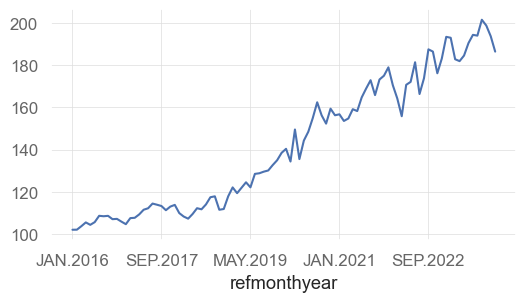

In [21]:
# 60/40 with strategy returns
t1 = 'SPYG'
t2 = 'VCIT'
w1 = .6
w2 = 1 - w1
pt6040 = w1 * dflstr[t1] + w2 * dflstr[t2]
((1 + pt6040).cumprod() * 100).plot()

<Axes: xlabel='refmonthyear'>

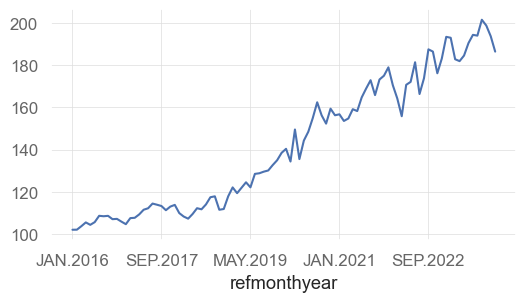

# 

In [ ]:
# dfy_trans.set_index('index', inplace=True)
rtnbygrp = dfy_trans.drop(['ticker', 'group_y'], axis=1).groupby(['group'])
rtnbygrp = rtnbygroup.agg('mean').T 
rtnbygrp.columns = ['Commodity', 'Debt', 'Equity']
rtnbygrp = pd.merge(dfx['cpiyoy1m.above'], rtnbygroup, left_index=True, right_index=True)


dfall = pd.merge(dfx, dfy_trans, left_index=True, right_index=True, how='left')
# dfall.to_clipboard()

In [ ]:
#%% plot matrix
dfplot = pd.melt(dfy_trans, var_name='ticker', ignore_index=False)

dfplot['group'] = dfplot['ticker'].apply(lambda x: dfref.loc[x]['group'])
dfplot

dfplot['cpiyoy1m.above'] = dfx['cpiyoy1m.above']
dfplot['posrtn'] = dfplot['value'] > 0
dfplot.dropna(inplace=True)

sb.boxplot(data=dfplot, x='group', y='posrtn', hue='cpiyoy1m.above')